# 📚 Comics Zero-Shot Baseline with Scene Descriptions

This notebook handles **everything** in one place:

1. **Part A**: Create the inference script (runs on GPU)
2. **Part B**: Create the SLURM batch file (submits the job)
3. **Part C**: Submit the job and monitor progress
4. **Part D**: Re-parse and visualize results

---

**You run this notebook from the Delta LOGIN node (no GPU needed).**

The actual inference runs as a batch job on the GPU node.

---
# PART A: Create the Inference Script
---

This cell creates the Python script that will run on the GPU node.

**You only need to run this once** (or when you want to change the script).

In [1]:
# =============================================================================
# CONFIGURATION - EDIT THESE IF NEEDED
# =============================================================================

PROJECT_DIR = "/scratch/bftl/hsekar/comics_project"
CONDA_ENV_PATH = "/u/hsekar/comics_env"
NUM_EXAMPLES = 1000  # Number of examples to evaluate

# =============================================================================
# CREATE DIRECTORIES
# =============================================================================

import os
from pathlib import Path

project_path = Path(PROJECT_DIR)
scripts_dir = project_path / "scripts"
logs_dir = project_path / "logs"
outputs_dir = project_path / "outputs" / "zero_shot_descp"

scripts_dir.mkdir(parents=True, exist_ok=True)
logs_dir.mkdir(parents=True, exist_ok=True)
outputs_dir.mkdir(parents=True, exist_ok=True)

print("✅ Directories created:")
print(f"   Scripts: {scripts_dir}")
print(f"   Logs: {logs_dir}")
print(f"   Outputs: {outputs_dir}")

✅ Directories created:
   Scripts: /scratch/bftl/hsekar/comics_project/scripts
   Logs: /scratch/bftl/hsekar/comics_project/logs
   Outputs: /scratch/bftl/hsekar/comics_project/outputs/zero_shot_descp


In [7]:
# =============================================================================
# CREATE THE INFERENCE SCRIPT
# =============================================================================
# This script uses a SIMPLE prompt and saves the raw free-form output.
# No complex structured output - just let the model describe what happens next.
# =============================================================================

script_content = f'''\
#!/usr/bin/env python3
"""
COMICS MULTIMODAL CLOZE - ZERO-SHOT BASELINE (DESCP)
=============================================
Simple approach: Ask model to predict next panel, save free-form output.

Author: Harsha Sekar
Date: December 2025
"""

import os
import json
import pickle
import random
import time
from datetime import datetime
from pathlib import Path
from typing import List, Dict

from PIL import Image
from tqdm import tqdm
import torch

from transformers import (
    LlavaOnevisionProcessor,
    LlavaOnevisionForConditionalGeneration,
)

# =============================================================================
# CONFIGURATION
# =============================================================================

PROJECT_DIR = Path("{PROJECT_DIR}")
DATA_DIR = PROJECT_DIR / "data"
PROCESSED_DIR = DATA_DIR / "processed"
OUTPUT_DIR = PROJECT_DIR / "outputs" / "zero_shot_descp"
MODEL_CACHE = PROJECT_DIR / "model_cache"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MODEL_ID = "llava-hf/llava-onevision-qwen2-7b-ov-hf"
NUM_EXAMPLES = {NUM_EXAMPLES}
CONTEXT_PANELS = 5
RANDOM_SEED = 42
MAX_IMAGE_SIZE = 672

GENERATION_CONFIG = {{
    "max_new_tokens": 800,
    "temperature": 0.3,
    "do_sample": True,
    "top_p": 0.9,
    "repetition_penalty": 1.1,
}}


# =============================================================================
# SIMPLE PROMPT - Just ask what happens next
# =============================================================================

def create_prompt(context_texts: List[str]) -> str:
    """Simple prompt asking model to predict the next panel."""
    
    prompt = """You are looking at 5 consecutive panels from a comic book.

Here is the text from each panel:
"""
    
    for i, text in enumerate(context_texts, 1):
        if text and text.strip():
            prompt += f"Panel {{i}}: {{text.strip()[:400]}}\\n"
        else:
            prompt += f"Panel {{i}}: [No text]\\n"
    
    prompt += """
Based on what you see in these 5 panels, describe what you think happens in the NEXT panel (Panel 6).

Include:
- What the scene looks like
- What the characters are doing
- Any dialogue they might say
- Any sound effects

Describe Panel 6:
"""
    return prompt


# =============================================================================
# IMAGE LOADING
# =============================================================================

def load_context_images(sequence: Dict, num_context: int = 5, max_size: int = 672) -> List[Image.Image]:
    """Load context panel images (NOT the target panel)."""
    images = []
    context_panels = sequence["context"][-num_context:]
    
    for panel in context_panels:
        img_path = Path(panel["image_path"])
        if img_path.exists():
            img = Image.open(img_path).convert("RGB")
            if max(img.size) > max_size:
                ratio = max_size / max(img.size)
                new_size = (int(img.size[0] * ratio), int(img.size[1] * ratio))
                img = img.resize(new_size, Image.LANCZOS)
            images.append(img)
        else:
            images.append(Image.new("RGB", (336, 336), color="gray"))
    
    return images


# =============================================================================
# INFERENCE
# =============================================================================

def run_inference(sequence: Dict, model, processor, gen_config: Dict) -> str:
    """Run inference and return raw model output."""
    
    images = load_context_images(sequence, num_context=CONTEXT_PANELS, max_size=MAX_IMAGE_SIZE)
    
    context_texts = sequence.get("context_texts", [])
    context_texts = context_texts[-CONTEXT_PANELS:] if len(context_texts) > CONTEXT_PANELS else context_texts
    while len(context_texts) < CONTEXT_PANELS:
        context_texts.insert(0, "")
    
    text_prompt = create_prompt(context_texts)
    image_placeholders = "\\n".join(["<image>" for _ in images])
    
    conversation = [{{
        "role": "user",
        "content": [{{"type": "text", "text": image_placeholders + "\\n\\n" + text_prompt}}]
    }}]
    
    prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)
    
    inputs = processor(
        images=images,
        text=prompt,
        return_tensors="pt",
        padding=True
    ).to(model.device)
    
    with torch.inference_mode():
        output_ids = model.generate(**inputs, **gen_config)
    
    input_len = inputs["input_ids"].shape[1]
    generated_ids = output_ids[0, input_len:]
    raw_output = processor.decode(generated_ids, skip_special_tokens=True)
    
    del inputs, output_ids
    torch.cuda.empty_cache()
    
    return raw_output


# =============================================================================
# MAIN
# =============================================================================

def main():
    print("="*70)
    print("COMICS ZERO-SHOT BASELINE (DESCP)")
    print("="*70)
    
    # GPU check
    print(f"\\nPyTorch: {{torch.__version__}}")
    print(f"CUDA available: {{torch.cuda.is_available()}}")
    if torch.cuda.is_available():
        print(f"GPU: {{torch.cuda.get_device_name(0)}}")
        print(f"GPU Memory: {{torch.cuda.get_device_properties(0).total_memory / 1e9:.1f}} GB")
    else:
        print("NO GPU! Exiting.")
        return
    
    # Load data
    print("\\nLoading data...")
    sequences_path = PROCESSED_DIR / "test_sequences_with_descriptions.pkl"
    with open(sequences_path, "rb") as f:
        all_sequences = pickle.load(f)
    print(f"Loaded {{len(all_sequences):,}} sequences")
    
    random.seed(RANDOM_SEED)
    sequences = random.sample(all_sequences, min(NUM_EXAMPLES, len(all_sequences)))
    print(f"Selected {{len(sequences)}} for evaluation")
    
    # Load model
    print("\\nLoading model...")
    start = time.time()
    
    processor = LlavaOnevisionProcessor.from_pretrained(MODEL_ID, cache_dir=MODEL_CACHE)
    model = LlavaOnevisionForConditionalGeneration.from_pretrained(
        MODEL_ID,
        torch_dtype=torch.float16,
        device_map="auto",
        cache_dir=MODEL_CACHE
    )
    
    print(f"Model loaded in {{time.time()-start:.1f}}s")
    print(f"GPU memory used: {{torch.cuda.memory_allocated()/1e9:.1f}} GB")
    
    # Run evaluation
    print(f"\\nRunning evaluation on {{len(sequences)}} examples...")
    results = []
    start_total = time.time()
    
    for i, seq in enumerate(tqdm(sequences, desc="Evaluating")):
        try:
            start = time.time()
            raw_output = run_inference(seq, model, processor, GENERATION_CONFIG)
            elapsed = time.time() - start
            
            # Clean up output (remove trailing "None" lines)
            if raw_output:
                lines = raw_output.strip().split("\\n")
                cleaned_lines = [l for l in lines if l.strip().lower() != "none"]
                scene_description = "\\n".join(cleaned_lines).strip()
            else:
                scene_description = ""
            
            # Store context image paths for visualization
            context_panels = seq["context"][-CONTEXT_PANELS:]
            
            results.append({{
                "id": i + 1,
                "comic_no": int(seq["comic_no"]),
                "story_idx": seq.get("story_idx"),
                
                # Context info
                "context_image_paths": [str(p["image_path"]) for p in context_panels],
                "context_texts": seq.get("context_texts", [])[-CONTEXT_PANELS:],
                
                # Target info
                "target_image_path": str(seq["target"]["image_path"]),
                "target_page_no": seq["target"].get("page_no"),
                "target_panel_no": seq["target"].get("panel_no"),
                
                # Ground truth
                "ground_truth": seq.get("scene_description", ""),
                
                # Prediction (simple: just the scene description)
                "scene_description": scene_description,
                "predicted_text": scene_description,  # Same thing for metrics
                "raw_output": raw_output,
                
                "inference_time": elapsed,
                "status": "success"
            }})
            
        except Exception as e:
            print(f"Error on {{i+1}}: {{e}}")
            results.append({{
                "id": i + 1,
                "comic_no": int(seq["comic_no"]),
                "status": "failed",
                "error": str(e)
            }})
    
    total_time = time.time() - start_total
    
    # Summary
    successful = [r for r in results if r["status"] == "success"]
    failed = [r for r in results if r["status"] == "failed"]
    has_scene = [r for r in successful if r.get("scene_description")]
    
    print(f"\\n" + "="*70)
    print("RESULTS")
    print("="*70)
    print(f"Total time: {{total_time:.1f}}s ({{total_time/len(sequences):.2f}}s per example)")
    print(f"Successful: {{len(successful)}}/{{len(sequences)}}")
    print(f"Scene descriptions: {{len(has_scene)}}/{{len(successful)}} ({{100*len(has_scene)/len(successful):.1f}}%)")
    
    # Save results
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    
    output_data = {{
        "metadata": {{
            "model": MODEL_ID,
            "task": "zero_shot_cloze",
            "approach": "free-form scene description",
            "num_examples": len(sequences),
            "successful": len(successful),
            "failed": len(failed),
            "scenes_extracted": len(has_scene),
            "total_time_seconds": total_time,
            "timestamp": datetime.now().isoformat(),
        }},
        "results": results
    }}
    
    # Save as latest (for easy access)
    latest_pkl = OUTPUT_DIR / "results_latest.pkl"
    with open(latest_pkl, "wb") as f:
        pickle.dump(output_data, f)
    print(f"\\n✅ Saved: {{latest_pkl}}")
    
    # Save timestamped version
    timestamped_pkl = OUTPUT_DIR / f"results_{{timestamp}}.pkl"
    with open(timestamped_pkl, "wb") as f:
        pickle.dump(output_data, f)
    print(f"✅ Saved: {{timestamped_pkl}}")
    
    # Save JSON
    json_file = OUTPUT_DIR / f"results_{{timestamp}}.json"
    with open(json_file, "w") as f:
        json.dump(output_data, f, indent=2, default=str)
    print(f"✅ Saved: {{json_file}}")
    
    print(f"\\n" + "="*70)
    print("DONE!")
    print("="*70)


if __name__ == "__main__":
    main()
'''

# Save the script
script_path = scripts_dir / "zero_shot_descp.py"
with open(script_path, 'w') as f:
    f.write(script_content)

print(f"✅ Script saved to: {script_path}")
print(f"\n   This script will evaluate {NUM_EXAMPLES} examples.")
print(f"   Output: Free-form scene descriptions (simple approach)")

✅ Script saved to: /scratch/bftl/hsekar/comics_project/scripts/zero_shot_descp.py

   This script will evaluate 1000 examples.
   Output: Free-form scene descriptions (simple approach)


---
# PART B: Create the SLURM Batch File
---

This creates the file that submits the job to the GPU cluster.

**Uses `gpuA100x8` partition (40GB GPUs)**

In [8]:
# =============================================================================
# CREATE SLURM BATCH FILE
# =============================================================================

sbatch_content = f'''#!/bin/bash
#SBATCH --job-name=comics_zero_shot
#SBATCH --account=bftl-delta-gpu
#SBATCH --partition=gpuA100x8
#SBATCH --nodes=1
#SBATCH --gpus-per-node=1
#SBATCH --cpus-per-task=16
#SBATCH --mem=80G
#SBATCH --time=10:00:00
#SBATCH --output={logs_dir}/zero_shot_%j.out
#SBATCH --error={logs_dir}/zero_shot_%j.err

echo "==========================================="
echo "COMICS ZERO-SHOT BASELINE (DESCP)"
echo "==========================================="
echo "Job ID: $SLURM_JOB_ID"
echo "Node: $SLURMD_NODENAME"
echo "Started: $(date)"
echo "==========================================="

# Load conda
source /sw/external/python/anaconda3/etc/profile.d/conda.sh
conda activate {CONDA_ENV_PATH}

# Show GPU info
echo ""
echo "GPU Info:"
nvidia-smi --query-gpu=name,memory.total --format=csv
echo ""

# Run the script
cd {PROJECT_DIR}
python {scripts_dir}/zero_shot_descp.py

echo ""
echo "==========================================="
echo "Finished: $(date)"
echo "==========================================="
'''

# Save the batch file
sbatch_path = project_path / "run_zero_shot.sbatch"
with open(sbatch_path, 'w') as f:
    f.write(sbatch_content)

print(f"✅ Batch file saved to: {sbatch_path}")
print(f"\n   Partition: gpuA100x8")
print(f"   Time limit: 10 hours")
print(f"   Logs: {logs_dir}")

✅ Batch file saved to: /scratch/bftl/hsekar/comics_project/run_zero_shot.sbatch

   Partition: gpuA100x8
   Time limit: 10 hours
   Logs: /scratch/bftl/hsekar/comics_project/logs


---
# PART C: Submit and Monitor the Job
---

In [9]:
# =============================================================================
# SUBMIT THE JOB
# =============================================================================

import subprocess

print("Submitting job to SLURM...")
print(f"Command: sbatch {sbatch_path}")
print()

result = subprocess.run(
    ['sbatch', str(sbatch_path)],
    capture_output=True,
    text=True
)

print(result.stdout)
if result.stderr:
    print(f"Errors: {result.stderr}")

if 'Submitted batch job' in result.stdout:
    job_id = result.stdout.strip().split()[-1]
    print(f"\n✅ Job submitted! Job ID: {job_id}")
    print(f"\n📋 Next: Run the cells below to monitor progress.")
else:
    print("\n❌ Job submission may have failed.")

Submitting job to SLURM...
Command: sbatch /scratch/bftl/hsekar/comics_project/run_zero_shot.sbatch

Submitted batch job 14124742


✅ Job submitted! Job ID: 14124742

📋 Next: Run the cells below to monitor progress.


In [19]:
# =============================================================================
# CHECK JOB STATUS
# =============================================================================

import subprocess
import os

print("Your jobs:")
print("="*70)

result = subprocess.run(
    ['squeue', '-u', os.environ.get('USER', 'hsekar')],
    capture_output=True,
    text=True
)
print(result.stdout)

print("\nStatus: PD=Pending, R=Running, CG=Completing")
print("If empty, job finished or failed. Check logs below.")

Your jobs:
       JOBID    PARTITION         NAME           USER ST       TIME  NODES RESERV   NODELIST(REASON) FEATURES
    14124742    gpuA100x8 comics_zero_         hsekar PD       0:00      1    RH9         (Priority) (null)
    14122545    gpuH200x8 comics_finet         hsekar  R    1:58:34      1    RH9             gpue01 (null)
    14122749    gpuH200x8 comics_ft_pr         hsekar  R    1:55:30      1    RH9             gpue01 (null)


Status: PD=Pending, R=Running, CG=Completing
If empty, job finished or failed. Check logs below.


In [16]:
# =============================================================================
# VIEW LOG OUTPUT
# =============================================================================

from pathlib import Path

logs_dir = Path(f"{PROJECT_DIR}/logs")
log_files = sorted(logs_dir.glob("zero_shot_*.out"), key=lambda x: x.stat().st_mtime, reverse=True)

if log_files:
    latest_log = log_files[0]
    print(f"📄 Log file: {latest_log}")
    print("="*70)
    
    with open(latest_log, 'r') as f:
        lines = f.readlines()
        print(''.join(lines[-60:]))  # Last 60 lines
else:
    print("No log files yet. Job may still be starting.")

📄 Log file: /scratch/bftl/hsekar/comics_project/logs/zero_shot_14120936.out
COMICS ZERO-SHOT BASELINE (DESCP)
Job ID: 14120936
Node: gpuc03
Started: Tue Dec 16 14:16:20 CST 2025

GPU Info:
name, memory.total [MiB]
NVIDIA A100-SXM4-40GB, 40960 MiB

COMICS ZERO-SHOT BASELINE (DESCP)

PyTorch: 2.5.1+cu121
CUDA available: True
GPU: NVIDIA A100-SXM4-40GB
GPU Memory: 42.4 GB

Loading data...
Loaded 54,530 sequences
Selected 10 for evaluation

Loading model...



---
# PART D: Visualize Results
---

**Run these cells AFTER the job completes.**

In [2]:
# =============================================================================
# LOAD RESULTS
# =============================================================================

import pickle
from pathlib import Path

results_path = Path(f"{PROJECT_DIR}/outputs/zero_shot_descp/results_latest.pkl")

if not results_path.exists():
    print(f"❌ Results not found: {results_path}")
    print("\n   Job may not have finished. Check status above.")
else:
    with open(results_path, 'rb') as f:
        data = pickle.load(f)
    
    metadata = data['metadata']
    results = data['results']
    
    print("✅ Results loaded!")
    print("="*60)
    print(f"\n📊 SUMMARY:")
    print(f"   Model: {metadata.get('model', 'N/A')}")
    print(f"   Approach: {metadata.get('approach', 'N/A')}")
    print(f"   Total examples: {metadata['num_examples']}")
    print(f"   Successful: {metadata['successful']}")
    print(f"   Scene descriptions: {metadata.get('scenes_extracted', 'N/A')}")
    print(f"   Total time: {metadata.get('total_time_seconds', 0):.1f}s")

✅ Results loaded!

📊 SUMMARY:
   Model: llava-hf/llava-onevision-qwen2-7b-ov-hf
   Approach: free-form scene description
   Total examples: 1000
   Successful: 1000
   Scene descriptions: 1000
   Total time: 6024.7s


In [3]:
# =============================================================================
# FIX EXISTING RESULTS (if needed)
# =============================================================================
# Run this cell if scene_description is empty but raw_output has content.
# This uses the raw free-form output as the scene description.
# =============================================================================

import pickle
from pathlib import Path

results_path = Path(f"{PROJECT_DIR}/outputs/zero_shot_descp/results_latest.pkl")

with open(results_path, 'rb') as f:
    data = pickle.load(f)

results = data['results']
fixed_count = 0

for r in results:
    if r['status'] != 'success':
        continue
    
    # If scene_description is empty but raw_output has content, use raw_output
    raw = r.get('raw_output', '')
    scene = r.get('scene_description', '')
    
    if raw and not scene:
        # Clean up the raw output
        lines = raw.strip().split('\n')
        cleaned = '\n'.join([l for l in lines if l.strip().lower() != 'none'])
        
        if cleaned:
            r['scene_description'] = cleaned
            r['predicted_text'] = cleaned
            fixed_count += 1

# Update counts
successful = [r for r in results if r['status'] == 'success']
has_scene = sum(1 for r in successful if r.get('scene_description'))
data['metadata']['scenes_extracted'] = has_scene

# Save
with open(results_path, 'wb') as f:
    pickle.dump(data, f)

print(f"✅ Fixed {fixed_count} results")
print(f"   Scene descriptions: {has_scene}/{len(successful)} ({100*has_scene/len(successful):.1f}%)")

✅ Fixed 0 results
   Scene descriptions: 1000/1000 (100.0%)


In [4]:
# =============================================================================
# VISUALIZATION FUNCTION
# =============================================================================

import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import textwrap

def visualize_result(result, figsize=(18, 10)):
    """
    Visualize a single result with:
    - Context images (what model saw)
    - Target image (for reference - model did NOT see this)
    - Ground truth and predictions
    """
    
    if result['status'] != 'success':
        print(f"❌ Example {result['id']} failed: {result.get('error', 'Unknown')}")
        return
    
    # Load context images
    context_paths = result.get('context_image_paths', [])
    target_path = result.get('target_image_path', '')
    
    images = []
    for p in context_paths:
        path = Path(p)
        if path.exists():
            images.append(Image.open(path).convert('RGB'))
        else:
            images.append(Image.new('RGB', (200, 300), color='lightgray'))
    
    # Load target image
    if Path(target_path).exists():
        target_img = Image.open(target_path).convert('RGB')
    else:
        target_img = Image.new('RGB', (200, 300), color='lightgray')
    
    # Create figure with 2 rows: images on top, text on bottom
    fig = plt.figure(figsize=figsize)
    
    # Title
    fig.suptitle(
        f"Comic #{result['comic_no']} | Story #{result.get('story_idx', '?')}\n"
        f"Model saw Context 1-5, predicted Panel 6 without seeing it",
        fontsize=14, fontweight='bold', y=0.98
    )
    
    # Image row
    n_images = len(images) + 1
    for i, img in enumerate(images):
        ax = fig.add_subplot(2, n_images, i + 1)
        ax.imshow(img)
        ax.set_title(f"Context {i+1}", fontsize=10, color='blue')
        ax.axis('off')
    
    # Target image
    ax_target = fig.add_subplot(2, n_images, n_images)
    ax_target.imshow(target_img)
    ax_target.set_title("TARGET\n(not shown to model)", fontsize=10, color='red', fontweight='bold')
    ax_target.axis('off')
    
    # Text row - spans all columns
    ax_text = fig.add_subplot(2, 1, 2)
    ax_text.axis('off')
    
    # Prepare text
    gt = result.get('ground_truth', '[Empty]')
    if not gt:
        gt = '[No text in this panel]'
    
    scene = result.get('scene_description', '[No prediction]')
    if not scene:
        scene = '[No prediction generated]'
    
    # Wrap text
    gt_wrapped = '\n'.join(textwrap.wrap(gt, width=100))
    scene_wrapped = '\n'.join(textwrap.wrap(scene, width=100))
    
    text_content = f"""GROUND TRUTH (actual text in Panel 6):
{gt_wrapped}

MODEL PREDICTION (scene description):
{scene_wrapped}"""
    
    ax_text.text(0.02, 0.95, text_content, transform=ax_text.transAxes,
                 fontsize=10, verticalalignment='top', fontfamily='monospace',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
    print("─" * 70)


print("✅ Visualization function ready!")

✅ Visualization function ready!


Showing 5 examples:

######################################################################
# EXAMPLE 1
######################################################################


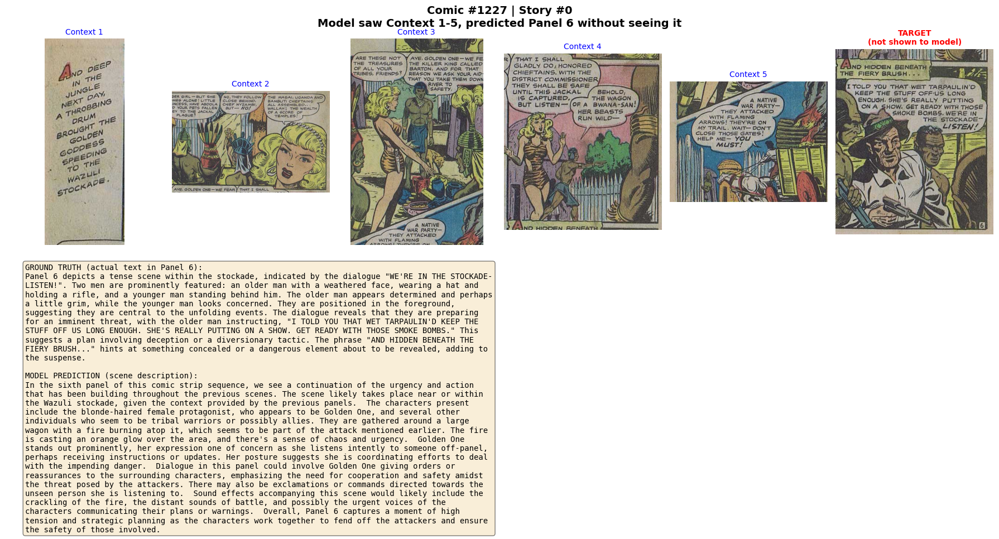

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 2
######################################################################


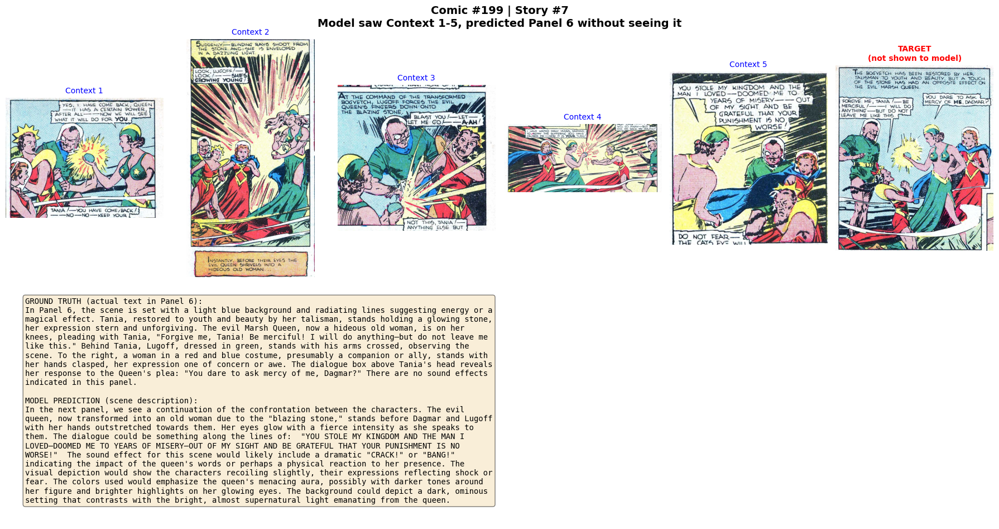

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 3
######################################################################


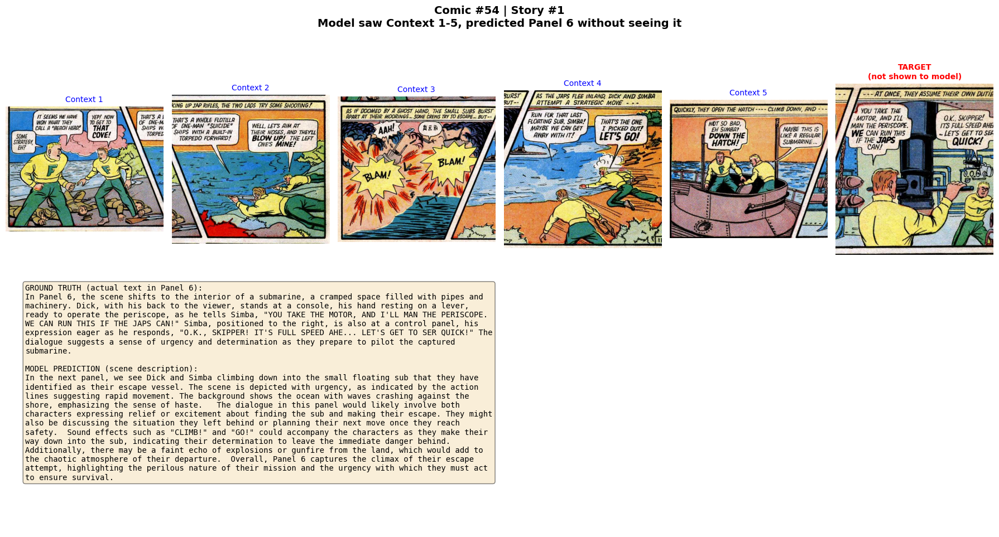

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 4
######################################################################


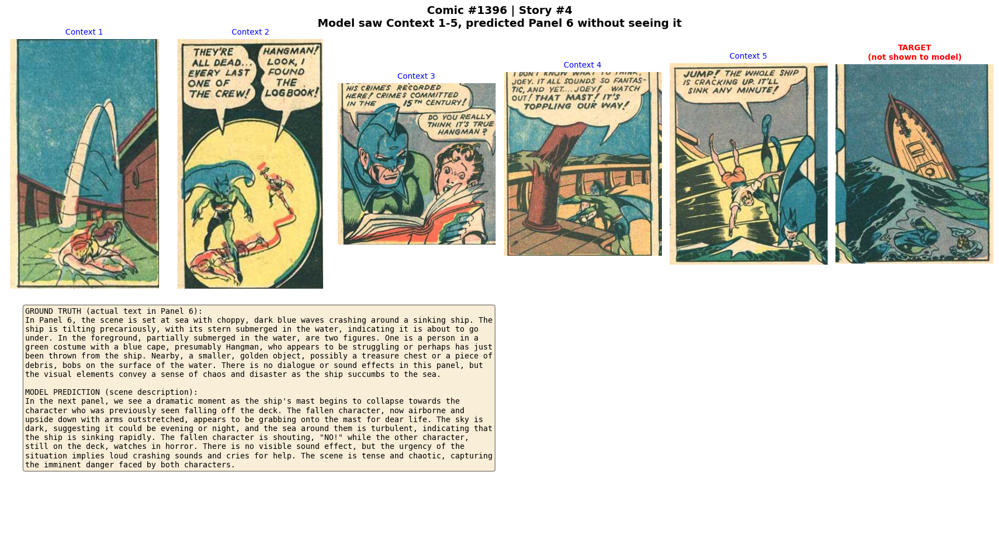

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 5
######################################################################


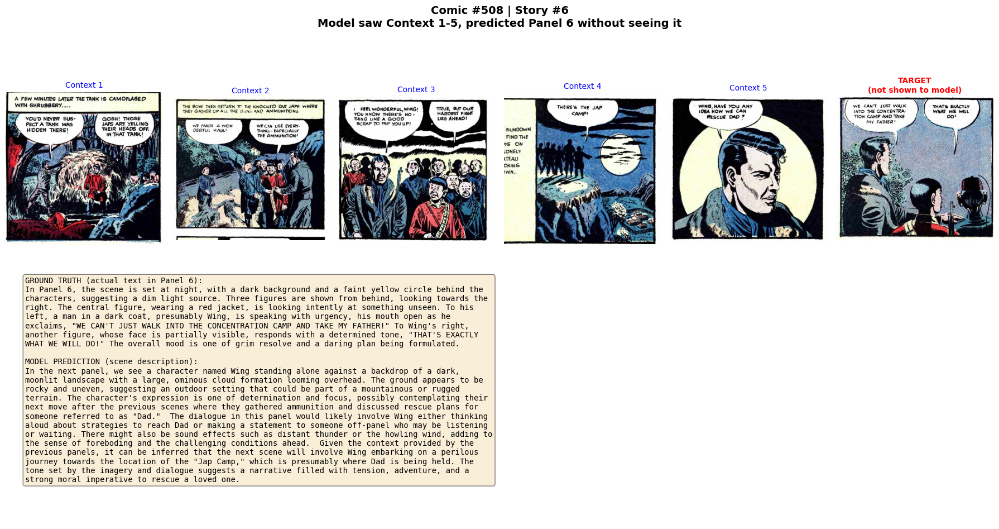

──────────────────────────────────────────────────────────────────────


In [19]:
# =============================================================================
# SHOW SAMPLE RESULTS
# =============================================================================

NUM_TO_SHOW = 5

print(f"Showing {NUM_TO_SHOW} examples:")
print("="*70)

successful = [r for r in results if r['status'] == 'success']

for i, result in enumerate(successful[:NUM_TO_SHOW]):
    print(f"\n{'#'*70}")
    print(f"# EXAMPLE {i+1}")
    print(f"{'#'*70}")
    visualize_result(result)

Example #7:


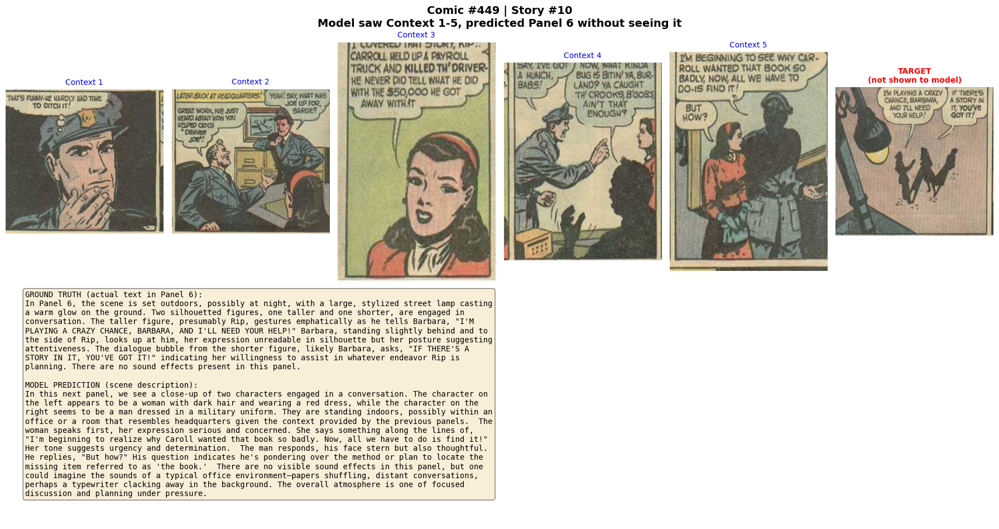

──────────────────────────────────────────────────────────────────────


In [21]:
# =============================================================================
# VIEW SPECIFIC EXAMPLE
# =============================================================================

EXAMPLE_NUMBER = 7  # Change this to view different examples (1 to 100)

for r in results:
    if r['id'] == EXAMPLE_NUMBER:
        print(f"Example #{EXAMPLE_NUMBER}:")
        visualize_result(r)
        break
else:
    print(f"Example {EXAMPLE_NUMBER} not found.")

In [5]:
# =============================================================================
# VIEW RAW MODEL OUTPUT (for debugging)
# =============================================================================

EXAMPLE_NUMBER = 567  # Change this

for r in results:
    if r['id'] == EXAMPLE_NUMBER:
        print(f"Example #{EXAMPLE_NUMBER} - Raw Model Output:")
        print("="*70)
        print(r.get('raw_output', '[No output]'))
        print("="*70)
        print(f"\nGround Truth: {r.get('ground_truth', '[Empty]')}")
        break

Example #567 - Raw Model Output:
In the next panel, we see the masked figure standing beside the overturned car with police officers approaching. The masked individual appears to be in a defensive stance, possibly preparing for an altercation or escape. There's a sense of urgency and confrontation as the police close in. Dialogue could include the masked character warning the police not to interfere or making a hasty retreat. Sound effects may include the crunching of metal from the car crash, sirens in the distance, and the masked character's urgent commands or threats.

Ground Truth: In Panel 6, the scene shifts to Tony's office, indicated by the text "LATER...IN TONY'S OFFICE...". Two men are present, one in a green suit and the other in a reddish-brown suit. The man in the green suit is speaking, his expression serious as he asks, "SO WEEMS FORCED YOU TO WORK AS HIS FRONT BECAUSE YOU OWED HIM MONEY! WHAT ELSE?". The man in the reddish-brown suit, facing away from the viewer, respon

In [6]:
# =============================================================================
# SUMMARY STATISTICS
# =============================================================================

successful = [r for r in results if r['status'] == 'success']

# Count results with content
has_scene = sum(1 for r in successful if r.get('scene_description'))
has_gt = sum(1 for r in successful if r.get('ground_truth'))

# Average prediction length
scene_lengths = [len(r.get('scene_description', '')) for r in successful if r.get('scene_description')]
avg_length = sum(scene_lengths) / len(scene_lengths) if scene_lengths else 0

print("="*70)
print("SUMMARY STATISTICS")
print("="*70)
print(f"\nTotal examples: {len(results)}")
print(f"Successful: {len(successful)}")
print(f"\nScene descriptions generated: {has_scene}/{len(successful)} ({100*has_scene/len(successful):.1f}%)")
print(f"Ground truth available: {has_gt}/{len(successful)} ({100*has_gt/len(successful):.1f}%)")
print(f"\nAverage prediction length: {avg_length:.0f} characters")

# Show a few sample predictions
print("\n" + "="*70)
print("SAMPLE PREDICTIONS (text only)")
print("="*70)

for i, r in enumerate(successful[:3]):
    print(f"\n--- Example {r['id']} ---")
    print(f"Prediction: {r.get('scene_description', '[None]')[:300]}...")
    print(f"Ground Truth: {r.get('ground_truth', '[Empty]')[:200]}...")

SUMMARY STATISTICS

Total examples: 1000
Successful: 1000

Scene descriptions generated: 1000/1000 (100.0%)
Ground truth available: 1000/1000 (100.0%)

Average prediction length: 1007 characters

SAMPLE PREDICTIONS (text only)

--- Example 1 ---
Prediction: In this next panel of the comic strip, we see a chaotic scene unfolding as the native war party continues their attack with flaming arrows. The characters appear to be in a state of urgency and defense. The golden-haired female character, who has been central to the narrative thus far, seems to be r...
Ground Truth: Panel 6 depicts a tense scene within the stockade, indicated by the dialogue "WE'RE IN THE STOCKADE- LISTEN!". Two men are prominently featured: an older man with a weathered face, wearing a hat and h...

--- Example 2 ---
Prediction: In the next panel, we see a continuation of the dramatic confrontation between the evil queen and the transformed characters. The scene remains intense with the blinding light still envelop

In [ ]:
# =============================================================================
# CALCULATE METRICS: BLEU, ROUGE, and BERTScore
# =============================================================================

import pickle
from pathlib import Path

PROJECT_DIR = "/scratch/bftl/hsekar/comics_project"
RESULTS_FILE = Path(f"{PROJECT_DIR}/outputs/zero_shot_descp/results_latest.pkl")

# Load results
with open(RESULTS_FILE, 'rb') as f:
    data = pickle.load(f)

results = data['results']
successful = [r for r in results if r['status'] == 'success']

# Prepare predictions and ground truths
predictions = []
ground_truths = []

for r in successful:
    pred = r.get('scene_description', '') or r.get('predicted_text', '')
    gt = r.get('ground_truth', '')
    
    if pred and gt and len(pred.strip()) > 10 and len(gt.strip()) > 5:
        predictions.append(pred.strip())
        ground_truths.append(gt.strip())

print(f"Examples with both prediction and ground truth: {len(predictions)}")

# -----------------------------------------------------------------------------
# BLEU SCORE
# -----------------------------------------------------------------------------
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import nltk
try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    nltk.download('punkt', quiet=True)

smoothing = SmoothingFunction().method1
bleu_scores = []

for pred, gt in zip(predictions, ground_truths):
    pred_tokens = pred.lower().split()
    gt_tokens = [gt.lower().split()]
    score = sentence_bleu(gt_tokens, pred_tokens, smoothing_function=smoothing)
    bleu_scores.append(score)

avg_bleu = sum(bleu_scores) / len(bleu_scores)
print(f"\n✅ BLEU Score: {avg_bleu:.4f}")

# -----------------------------------------------------------------------------
# ROUGE SCORE
# -----------------------------------------------------------------------------
from rouge_score import rouge_scorer

scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
rouge1_scores, rouge2_scores, rougeL_scores = [], [], []

for pred, gt in zip(predictions, ground_truths):
    scores = scorer.score(gt, pred)
    rouge1_scores.append(scores['rouge1'].fmeasure)
    rouge2_scores.append(scores['rouge2'].fmeasure)
    rougeL_scores.append(scores['rougeL'].fmeasure)

avg_rouge1 = sum(rouge1_scores) / len(rouge1_scores)
avg_rouge2 = sum(rouge2_scores) / len(rouge2_scores)
avg_rougeL = sum(rougeL_scores) / len(rougeL_scores)

print(f"✅ ROUGE-1: {avg_rouge1:.4f}")
print(f"✅ ROUGE-2: {avg_rouge2:.4f}")
print(f"✅ ROUGE-L: {avg_rougeL:.4f}")

# -----------------------------------------------------------------------------
# BERTSCORE
# -----------------------------------------------------------------------------
from bert_score import score as bert_score
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"\nCalculating BERTScore (device: {device})...")

P, R, F1 = bert_score(predictions, ground_truths, lang='en', device=device, verbose=False)

avg_bert_precision = P.mean().item()
avg_bert_recall = R.mean().item()
avg_bert_f1 = F1.mean().item()

print(f"✅ BERTScore Precision: {avg_bert_precision:.4f}")
print(f"✅ BERTScore Recall:    {avg_bert_recall:.4f}")
print(f"✅ BERTScore F1:        {avg_bert_f1:.4f}")

# -----------------------------------------------------------------------------
# SUMMARY
# -----------------------------------------------------------------------------
print("\n" + "="*50)
print("ZERO-SHOT BASELINE (DESCP) METRICS SUMMARY")
print("="*50)
print(f"  Examples:        {len(predictions)}")
print(f"  BLEU:            {avg_bleu:.4f}")
print(f"  ROUGE-1:         {avg_rouge1:.4f}")
print(f"  ROUGE-2:         {avg_rouge2:.4f}")
print(f"  ROUGE-L:         {avg_rougeL:.4f}")
print(f"  BERTScore F1:    {avg_bert_f1:.4f}")
print("="*50)

# Save metrics to results
data['metadata']['bleu'] = avg_bleu
data['metadata']['rouge1'] = avg_rouge1
data['metadata']['rouge2'] = avg_rouge2
data['metadata']['rougeL'] = avg_rougeL
data['metadata']['bertscore_f1'] = avg_bert_f1

with open(RESULTS_FILE, 'wb') as f:
    pickle.dump(data, f)
print("\n✅ Metrics saved to results file!")

Examples with both prediction and ground truth: 1000

✅ BLEU Score: 0.0155
✅ ROUGE-1: 0.3300
✅ ROUGE-2: 0.0626
✅ ROUGE-L: 0.1726


/u/hsekar/comics_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Calculating BERTScore (device: cpu)...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ BERTScore Precision: 0.8489
✅ BERTScore Recall:    0.8454
✅ BERTScore F1:        0.8471

ZERO-SHOT BASELINE (DESCP) METRICS SUMMARY
  Examples:        1000
  BLEU:            0.0155
  ROUGE-1:         0.3300
  ROUGE-2:         0.0626
  ROUGE-L:         0.1726
  BERTScore F1:    0.8471

✅ Metrics saved to results file!


: 

In [9]:
import pickle

with open("/scratch/bftl/hsekar/comics_project/data/processed/test_sequences_with_descriptions.pkl", "rb") as f:
    data = pickle.load(f)

# Check first few sequences
for i in range(5):
    seq = data[i]
    print(f"Sequence {i}:")
    print(f"  scene_description: {seq.get('scene_description', 'NOT FOUND')[:100] if seq.get('scene_description') else 'EMPTY/NONE'}")
    print(f"  target_text: {seq.get('target_text', 'NOT FOUND')[:100] if seq.get('target_text') else 'EMPTY/NONE'}")
    print()

Sequence 0:
  scene_description: In Panel 6, Dave Kenton, a young Star Patrolman, stands with his arms crossed, holding a piece of pa
  target_text: JUST GOT MY ORDERS, SWEETHEART! I'M ROCKET- TING UP TONIGHT! SEALED ORDERS-TO GET THOSE PIRATES! ONE

Sequence 1:
  scene_description: In Panel 6, the scene is set inside what appears to be a spaceship or a control room, with a large w
  target_text: EDITOR'S NOTE: A LIGHT YEAR ANCE LIGHT WILL TRAVEL IN ONE AT 186,225 MILES PER SECOND THE HIGHER-UPS

Sequence 2:
  scene_description: In the final panel, a close-up shot focuses on the faces of two characters, one in silhouette and th
  target_text: YOU-YOU'RE NO BELL- HOP! NOT EXACT- LY- SWEET- HEART! GET OVER THERE IN THE CORNER! TURN AROUND, FAC

Sequence 3:
  scene_description: In Panel 6, the scene appears to be inside a spacecraft, with a large window showing a starry expans
  target_text: NOBODY TAKES- I DIDN'T WANT TO SHOOT- BUT I'LL HAVE TO.. TRAVEL IN A ROCKET SHIP OFF PATROLMAN KEN

---
# Summary
---

## What We Did

1. Created inference script with **simple prompt** (no complex structured output)
2. Ran evaluation on GPU via SLURM
3. Model outputs **free-form scene descriptions** - used as-is

## Output Files

```
/scratch/bftl/hsekar/comics_project/outputs/zero_shot_baseline/
├── results_latest.pkl     ← For visualization
├── results_TIMESTAMP.pkl  ← Backup
└── results_TIMESTAMP.json ← Human-readable
```

## For Your Report

The zero-shot baseline shows:
- Model understands comic narrative context
- Generates coherent scene descriptions
- Can be used as input for Stable Diffusion

## Next Step

**Fine-tuning the model** to generate more accurate predictions!